In [1]:
import numpy as np
import pandas as pd
import pandas_profiling
import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

%matplotlib inline

In [2]:
import warnings

warnings.filterwarnings('ignore')

In [3]:
with open('train.csv') as t:
    for _ in range(4):
        print(t.readline())
    

is_profit,sym,datetime,rsi14,sma9_var,sma180_var,vwap_var,spread14_e,volume14_34_var,prev_close_var,prev_floor_var,prev_ceil_var,prev1_candle_score,prev2_candle_score,prev3_candle_score,mins_from_start,valley_interval_mins,valley_close_score,valley_rsi_score,day_open_var,open_from_prev_close_var,ceil_var,floor_var

True,MGNX,2020-11-02 11:13:00,30.50976078043739,-0.00622295056271871,-0.02267895324155822,-0.017526379752182852,0.0006202774305198358,-0.006472194386474617,-0.03703709881292083,-0.012658216387505639,-0.04732826072417706,-0.0029247702357464433,0.0,0.0,103.0,50.0,0.42553152634362545,0.7580462443517035,-0.0320579542058812,-0.005144052403421084,-0.03455389878205117,0.0008018919919603462

True,MGNX,2020-11-02 13:55:00,46.452741454173875,-0.0010615954141022232,-0.004720950390035505,-0.007713113849248554,0.0006945504312959998,0.28024905167402747,-0.03189304640949975,-0.007383934409737947,-0.042239182687991095,0.0,0.0010615954141022232,0.0005042596322599735,265.0,67.0,0.633584138593

In [4]:
ds = pd.read_csv('train.csv')

In [5]:
ds.head(3)

,is_profit,sym,datetime,rsi14,sma9_var,sma180_var,vwap_var,spread14_e,volume14_34_var,prev_close_var,...,prev2_candle_score,prev3_candle_score,mins_from_start,valley_interval_mins,valley_close_score,valley_rsi_score,day_open_var,open_from_prev_close_var,ceil_var,floor_var
0,True,MGNX,2020-11-02 11:13:00,30.509761,-0.006223,-0.022679,-0.017526,0.000620,-0.006472,-0.037037,...,0.000000,0.000000,103.0,50.0,0.425532,0.758046,-0.032058,-0.005144,-0.034554,0.000802
1,True,MGNX,2020-11-02 13:55:00,46.452741,-0.001062,-0.004721,-0.007713,0.000695,0.280249,-0.031893,...,0.001062,0.000504,265.0,67.0,0.633584,10.958588,-0.026887,-0.005144,-0.029397,0.006148
2,True,AEIS,2020-11-02 14:08:00,34.336224,-0.004443,-0.016648,-0.016589,0.000518,0.284800,0.011396,...,-0.001020,0.000000,278.0,13.0,0.306356,2.964667,-0.003935,0.015391,-0.030638,0.000000


In [6]:
ds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 258729 entries, 0 to 258728
Data columns (total 23 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   is_profit                 258729 non-null  bool   
 1   sym                       258729 non-null  object 
 2   datetime                  258729 non-null  object 
 3   rsi14                     258729 non-null  float64
 4   sma9_var                  258729 non-null  float64
 5   sma180_var                258729 non-null  float64
 6   vwap_var                  258729 non-null  float64
 7   spread14_e                258729 non-null  float64
 8   volume14_34_var           258729 non-null  float64
 9   prev_close_var            258729 non-null  float64
 10  prev_floor_var            258729 non-null  float64
 11  prev_ceil_var             258729 non-null  float64
 12  prev1_candle_score        258729 non-null  float64
 13  prev2_candle_score        258729 non-null  f

In [7]:
ds.isnull().sum()

is_profit                   0
sym                         0
datetime                    0
rsi14                       0
sma9_var                    0
sma180_var                  0
vwap_var                    0
spread14_e                  0
volume14_34_var             0
prev_close_var              0
prev_floor_var              0
prev_ceil_var               0
prev1_candle_score          0
prev2_candle_score          0
prev3_candle_score          0
mins_from_start             0
valley_interval_mins        0
valley_close_score          0
valley_rsi_score            0
day_open_var                0
open_from_prev_close_var    0
ceil_var                    0
floor_var                   0
dtype: int64

In [8]:
ds.duplicated().sum()

0

In [9]:
ds.shape

(258729, 23)

In [10]:
#pandas_profiling.ProfileReport(ds)

In [11]:
columns = ds.columns
columns

Index(['is_profit', 'sym', 'datetime', 'rsi14', 'sma9_var', 'sma180_var',
       'vwap_var', 'spread14_e', 'volume14_34_var', 'prev_close_var',
       'prev_floor_var', 'prev_ceil_var', 'prev1_candle_score',
       'prev2_candle_score', 'prev3_candle_score', 'mins_from_start',
       'valley_interval_mins', 'valley_close_score', 'valley_rsi_score',
       'day_open_var', 'open_from_prev_close_var', 'ceil_var', 'floor_var'],
      dtype='object')

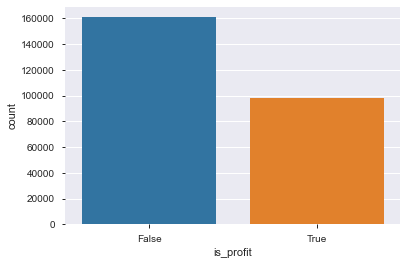

In [12]:
sns.countplot(ds.is_profit);

In [13]:
len(ds.sym.unique())

2610

In [14]:
columns[3:]

Index(['rsi14', 'sma9_var', 'sma180_var', 'vwap_var', 'spread14_e',
       'volume14_34_var', 'prev_close_var', 'prev_floor_var', 'prev_ceil_var',
       'prev1_candle_score', 'prev2_candle_score', 'prev3_candle_score',
       'mins_from_start', 'valley_interval_mins', 'valley_close_score',
       'valley_rsi_score', 'day_open_var', 'open_from_prev_close_var',
       'ceil_var', 'floor_var'],
      dtype='object')

In [15]:
def plot_hist_boxplot(data, col=columns[3:]):
    plt.figure(figsize=(18, 35))
    for i, feature in enumerate(col):
        plt.subplot(10, 4, i*2+1)
        plt.hist(data[feature], bins=50)
        plt.title(feature)
        plt.subplot(10, 4, i*2+2)
        plt.boxplot(data[feature])
        plt.title(feature)

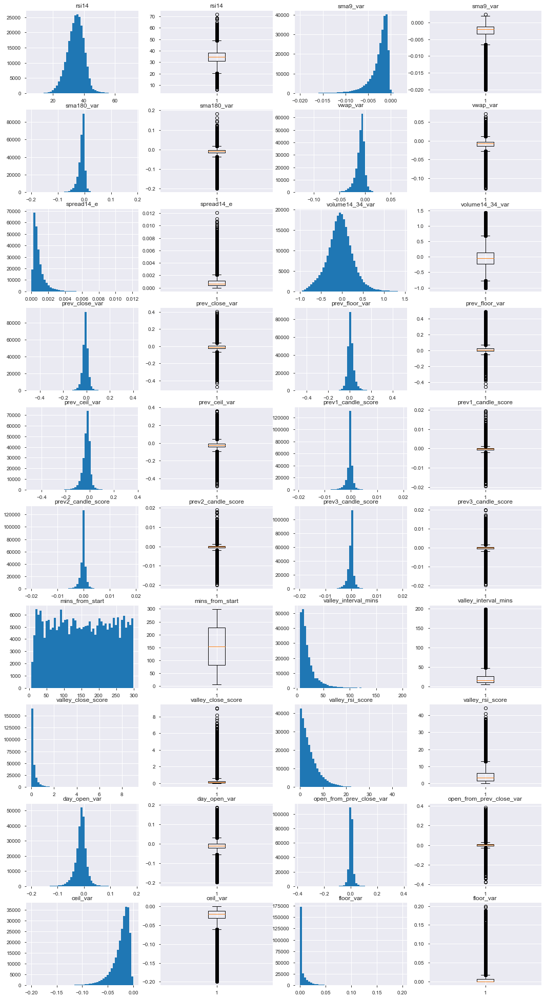

In [16]:
plot_hist_boxplot(data=ds, col=columns[3:])

to log -> spread14_e | valley_interval_mins | valley_close_score | valley_rsi_score

In [17]:
columns_log = ['spread14_e', 'valley_interval_mins', 'valley_close_score', 'valley_rsi_score']

In [18]:
def replace_outlier(data, treshold=3):
    
    df = data.copy(deep=True)
    
    for col in list(df.columns):
        
        IQR = df[col].quantile(0.75) - df[col].quantile(0.25)
        lower_fence = df[col].quantile(0.25) - IQR * treshold
        upper_fence = df[col].quantile(0.75) + IQR * treshold
        
        index_below_lower = df[col][df[col] < lower_fence].index
        index_above_upper = df[col][df[col] > upper_fence].index
        
        df[col][index_below_lower] = lower_fence
        df[col][index_above_upper] = upper_fence
        
    return df

In [19]:
df_log = ds.copy(deep=True)

In [20]:
df_log[columns_log] = np.log(df_log[columns_log])

In [21]:
ds_free_outlier = replace_outlier(df_log[columns[3:]], treshold=3)

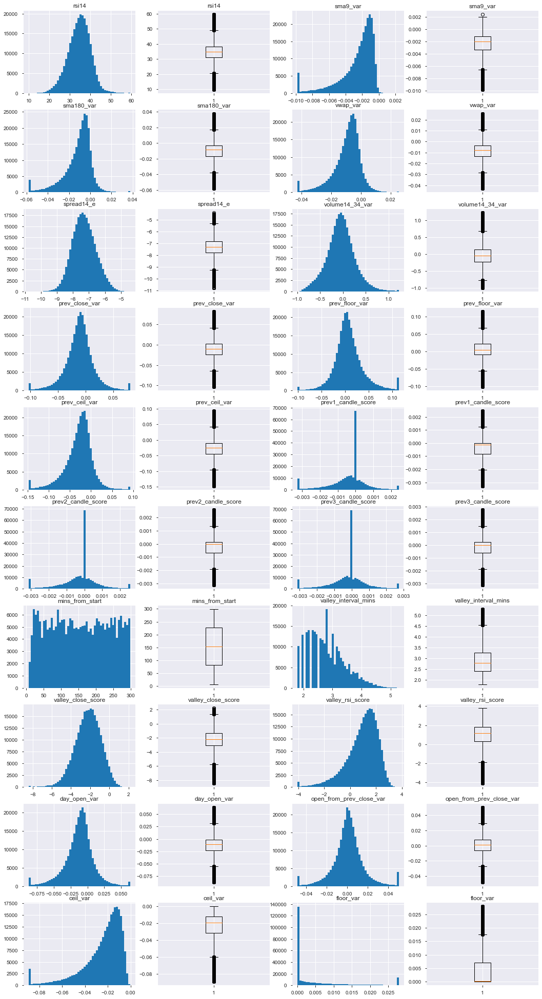

In [22]:
plot_hist_boxplot(data=ds_free_outlier)

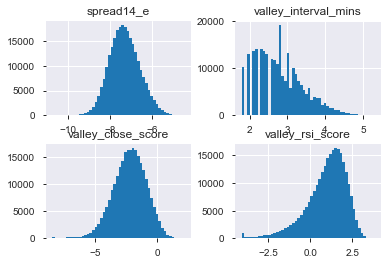

In [23]:
ds_free_outlier[columns_log].hist(bins=50);

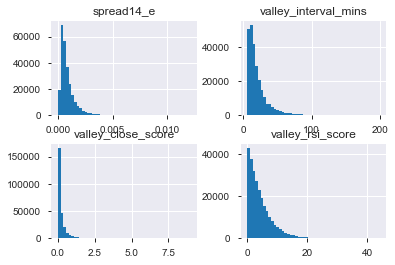

In [24]:
ds[columns_log].hist(bins=50);

In [25]:
ds.is_profit[ds.is_profit == True].count(), ds.is_profit[ds.is_profit == False].count()

(97756, 160973)

In [26]:
index_true = ds.is_profit[ds.is_profit == True].index
index_false = ds.is_profit[ds.is_profit == False].index

In [27]:
index_true = np.random.choice(index_true, 10000)
index_false = np.random.choice(index_false, 10000)

In [28]:
len(index_true), len(index_false)

(10000, 10000)

In [29]:
ds_free_outlier = pd.concat([ds_free_outlier, ds.is_profit], axis=1)

In [30]:
ds_free_outlier

,rsi14,sma9_var,sma180_var,vwap_var,spread14_e,volume14_34_var,prev_close_var,prev_floor_var,prev_ceil_var,prev1_candle_score,...,prev3_candle_score,mins_from_start,valley_interval_mins,valley_close_score,valley_rsi_score,day_open_var,open_from_prev_close_var,ceil_var,floor_var,is_profit
0,30.509761,-0.006223,-0.022679,-0.017526,-7.385344,-0.006472,-0.037037,-0.012658,-0.047328,-0.002925,...,0.000000,103.0,3.912023,-0.854416,-0.277011,-0.032058,-0.005144,-0.034554,0.000802,True
1,46.452741,-0.001062,-0.004721,-0.007713,-7.272246,0.280249,-0.031893,-0.007384,-0.042239,0.000000,...,0.000504,265.0,4.204693,-0.456362,2.394123,-0.026887,-0.005144,-0.029397,0.006148,True
2,34.336224,-0.004443,-0.016648,-0.016589,-7.566430,0.284800,0.011396,0.023360,-0.014706,0.000000,...,0.000000,278.0,2.564949,-1.183009,1.086765,-0.003935,0.015391,-0.030638,0.000000,True
3,36.584676,-0.001006,0.005697,-0.004279,-8.026447,-0.514448,0.017371,0.023517,0.001266,-0.000105,...,0.000000,110.0,2.079442,-3.166717,0.955265,0.003596,0.013725,-0.014746,0.003596,False
4,29.113480,-0.000950,0.002626,-0.001767,-8.159433,-0.033291,0.019482,0.035230,-0.001628,-0.000375,...,0.000000,229.0,3.367296,-1.494402,-2.386801,0.008738,0.010651,-0.016754,0.011470,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
258724,32.602899,-0.002293,-0.033872,-0.011582,-6.800167,0.462271,-0.029817,-0.028145,-0.060000,0.000000,...,-0.000590,85.0,2.944439,-2.136508,2.020314,-0.021400,-0.008601,-0.030373,0.000000,False
258725,37.355860,-0.002370,-0.021928,-0.015194,-7.663535,-0.238875,-0.038417,-0.036760,-0.068333,0.000000,...,0.000209,247.0,3.828641,-0.573956,2.390407,-0.030075,-0.008601,-0.038968,0.000000,False
258726,41.550637,-0.001991,-0.014774,-0.003803,-6.914852,-0.062510,0.057895,0.105147,0.050330,0.000000,...,0.002734,285.0,2.995732,-2.551134,0.428710,0.063730,-0.012065,-0.037562,0.027957,True
258727,35.433061,-0.005427,-0.012600,-0.015767,-6.256541,0.046143,0.004747,0.015770,-0.095270,-0.001007,...,0.002687,146.0,2.484907,-1.445214,1.465849,0.003386,0.001356,-0.033909,0.003386,False


In [31]:
ds_free_outlier_short = pd.concat([ds_free_outlier.loc[index_true], ds_free_outlier.loc[index_false]], 
                                  ignore_index=True)

In [32]:
ds_free_outlier_short

,rsi14,sma9_var,sma180_var,vwap_var,spread14_e,volume14_34_var,prev_close_var,prev_floor_var,prev_ceil_var,prev1_candle_score,...,prev3_candle_score,mins_from_start,valley_interval_mins,valley_close_score,valley_rsi_score,day_open_var,open_from_prev_close_var,ceil_var,floor_var,is_profit
0,35.038383,-0.005450,-0.058032,-0.019433,-6.221369,-0.727490,-0.063406,-0.005750,-0.116602,-0.000019,...,-0.002115,32.0,2.397895,-2.336964,0.896844,-0.024528,-0.039855,-0.034132,0.005837,True
1,24.557269,-0.003446,-0.005265,-0.015520,-7.125600,-0.204204,0.002045,0.010570,-0.018159,-0.000509,...,-0.000763,65.0,3.135494,-0.583243,0.644359,-0.014332,0.016616,-0.024390,0.000000,True
2,30.245808,-0.006703,-0.022926,-0.021243,-6.395986,-0.326475,-0.022877,-0.015243,-0.028716,-0.003270,...,0.000000,132.0,2.890372,-0.718029,1.275857,-0.032048,0.009475,-0.036291,0.000000,True
3,36.276981,-0.002604,-0.002390,-0.007877,-6.926947,-0.219443,-0.010562,0.010612,-0.010731,0.000043,...,-0.000563,32.0,2.995732,-4.341636,1.187249,-0.016494,0.006032,-0.016494,0.000000,True
4,31.447810,-0.002039,-0.023345,-0.003805,-6.778386,0.228217,-0.040561,-0.024315,-0.089108,-0.001024,...,0.000039,83.0,2.564949,-1.428800,1.414247,0.013904,-0.048452,-0.029485,0.027095,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,35.827430,-0.001777,-0.000031,-0.001401,-7.210863,-0.133137,0.000467,0.038108,-0.000777,-0.000932,...,-0.000310,121.0,2.833213,-3.470736,-1.665456,0.007522,-0.007003,-0.009399,0.010372,False
19996,35.073173,-0.001283,-0.006258,-0.010274,-8.442589,-0.041525,0.015905,0.028171,0.007889,0.000000,...,0.000130,205.0,3.044522,-8.429788,1.970302,0.006433,0.009411,-0.024690,0.006433,False
19997,29.665863,-0.002336,-0.012171,-0.009091,-7.367735,-0.617226,-0.017934,-0.007897,-0.025403,0.000624,...,-0.001245,77.0,3.761200,-0.985670,2.375107,-0.012180,-0.005825,-0.015383,0.000000,False
19998,30.342530,-0.001973,-0.028551,-0.005047,-6.908275,-0.200791,-0.048410,-0.030324,-0.052627,0.000667,...,0.000000,89.0,2.833213,-0.603025,-0.338829,0.001249,-0.048452,-0.022725,0.015214,False


In [33]:
from sklearn.utils import shuffle

In [34]:
ds_free_outlier_short = shuffle(ds_free_outlier_short)

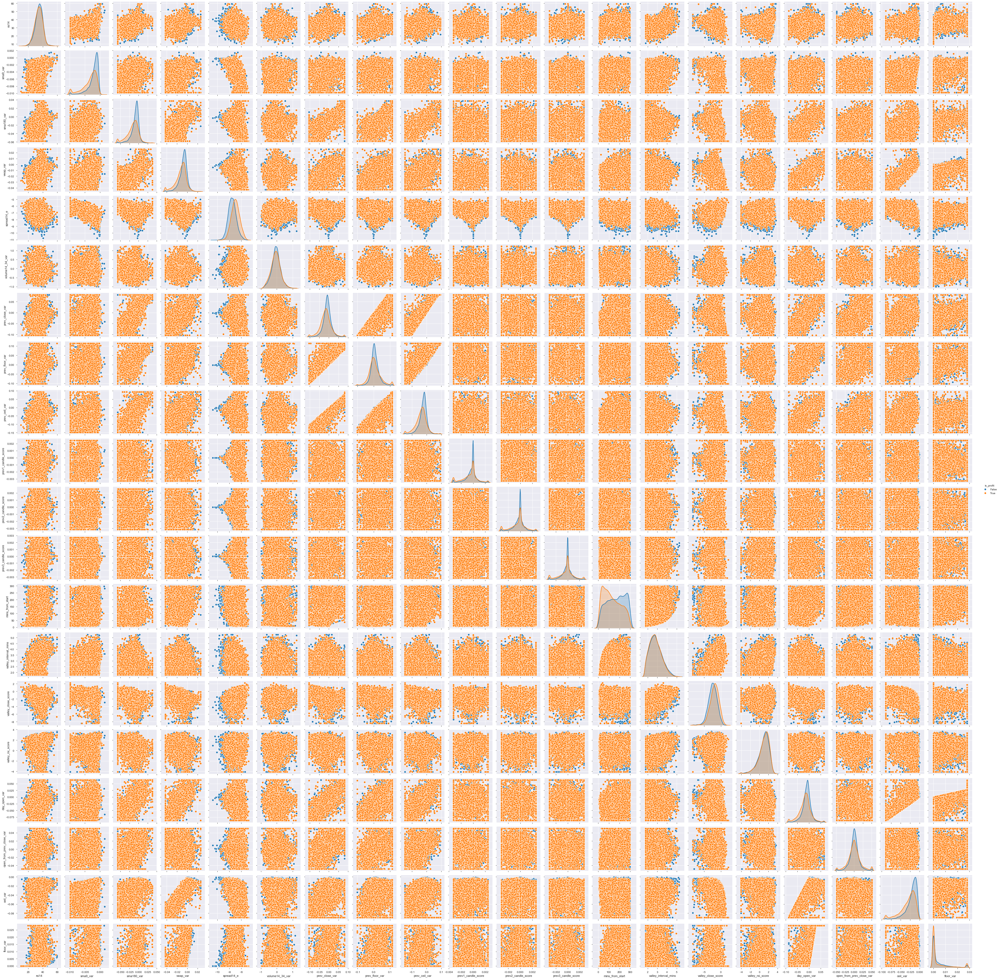

In [35]:
sns.pairplot(ds_free_outlier_short, hue='is_profit')

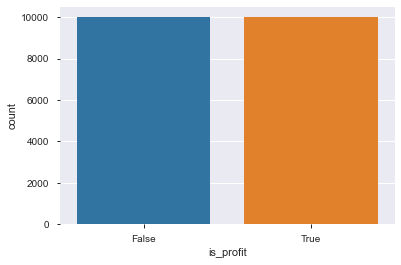

In [36]:
sns.countplot(ds_free_outlier_short.is_profit);

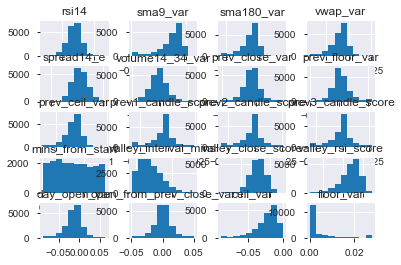

In [38]:
ds_free_outlier_short.drop(['is_profit'], axis=1).hist();

In [39]:
ds.columns

Index(['is_profit', 'sym', 'datetime', 'rsi14', 'sma9_var', 'sma180_var',
       'vwap_var', 'spread14_e', 'volume14_34_var', 'prev_close_var',
       'prev_floor_var', 'prev_ceil_var', 'prev1_candle_score',
       'prev2_candle_score', 'prev3_candle_score', 'mins_from_start',
       'valley_interval_mins', 'valley_close_score', 'valley_rsi_score',
       'day_open_var', 'open_from_prev_close_var', 'ceil_var', 'floor_var'],
      dtype='object')

In [40]:
columns_log, columns[3: ]

(['spread14_e',
  'valley_interval_mins',
  'valley_close_score',
  'valley_rsi_score'],
 Index(['rsi14', 'sma9_var', 'sma180_var', 'vwap_var', 'spread14_e',
        'volume14_34_var', 'prev_close_var', 'prev_floor_var', 'prev_ceil_var',
        'prev1_candle_score', 'prev2_candle_score', 'prev3_candle_score',
        'mins_from_start', 'valley_interval_mins', 'valley_close_score',
        'valley_rsi_score', 'day_open_var', 'open_from_prev_close_var',
        'ceil_var', 'floor_var'],
       dtype='object'))

In [41]:
columns_categorical = [col for col in ds.columns if col not in (columns_log and columns[3:])]

In [42]:
columns_categorical

['is_profit', 'sym', 'datetime']

In [43]:
ds.sym.value_counts()[ds.sym.value_counts() < 100]

ACAD    99
MESO    99
CATY    99
APTS    99
VRRM    98
        ..
TRS      1
LOAC     1
AVK      1
NGVC     1
CVLG     1
Name: sym, Length: 1323, dtype: int64

In [47]:
ds.datetime.sort_values()

34747     2020-06-29 09:38:00
35497     2020-06-29 09:41:00
35390     2020-06-29 09:41:00
35009     2020-06-29 09:42:00
34871     2020-06-29 09:42:00
                 ...         
258409    2021-01-22 14:29:00
258076    2021-01-22 14:29:00
258469    2021-01-22 14:29:00
258625    2021-01-22 14:29:00
257530    2021-01-22 14:29:00
Name: datetime, Length: 258729, dtype: object

In [48]:
date = ds.datetime.values

In [49]:
date

array(['2020-11-02 11:13:00', '2020-11-02 13:55:00',
       '2020-11-02 14:08:00', ..., '2021-01-22 14:15:00',
       '2021-01-22 11:56:00', '2021-01-22 13:06:00'], dtype=object)

In [50]:
date[1]

'2020-11-02 13:55:00'

In [51]:
date[1].split()[0]

'2020-11-02'

In [52]:
date[1].split()

['2020-11-02', '13:55:00']

In [53]:
ds.sort_values(by=['datetime'], inplace=True)

In [54]:
def d_year(data):
    
    year_month_day = [d.split()[0] for d in data]
    d_time = [d.split()[1] for d in data]
    
    year = []
    month = []
    day = []
    hour = []
    minutes = []
    
    year = [int(d.split('-')[0]) for d in year_month_day]
    month = [int(d.split('-')[1]) for d in year_month_day]
    day = [int(d.split('-')[2]) for d in year_month_day]
    hour = [int(d.split(':')[0]) for d in d_time]
    minutes = [int(d.split(':')[1]) for d in d_time]
        
    df_date = pd.DataFrame({'year': year, 'month': month, 'day': day, 'hour': hour, 'minutes': minutes})
    
    return df_date

In [55]:
df_date = d_year(date)

In [56]:
type(df_date)

pandas.core.frame.DataFrame

In [57]:
df_date.shape, ds.shape

((258729, 5), (258729, 23))

In [58]:
df_date

,year,month,day,hour,minutes
0,2020,11,2,11,13
1,2020,11,2,13,55
2,2020,11,2,14,8
3,2020,11,2,11,20
4,2020,11,2,13,19
...,...,...,...,...,...
258724,2021,1,22,10,55
258725,2021,1,22,13,37
258726,2021,1,22,14,15
258727,2021,1,22,11,56


In [59]:
ds.datetime

34747     2020-06-29 09:38:00
35497     2020-06-29 09:41:00
35390     2020-06-29 09:41:00
35009     2020-06-29 09:42:00
34871     2020-06-29 09:42:00
                 ...         
258409    2021-01-22 14:29:00
258076    2021-01-22 14:29:00
258469    2021-01-22 14:29:00
258625    2021-01-22 14:29:00
257530    2021-01-22 14:29:00
Name: datetime, Length: 258729, dtype: object

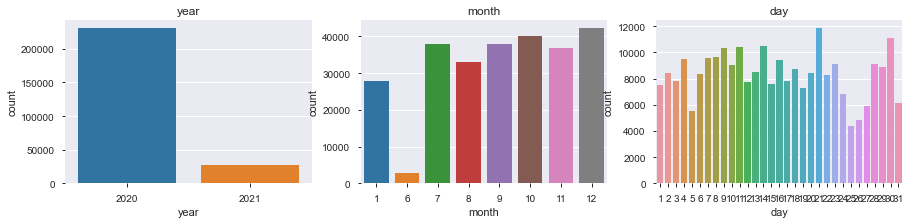

In [62]:
plt.figure(figsize=(15, 3))
plt.subplot(1, 3, 1)
sns.countplot(df_date.year)
plt.title('year')
plt.subplot(1, 3, 2)
sns.countplot(df_date.month)
plt.title('month')
plt.subplot(1, 3, 3)
sns.countplot(df_date.day)
plt.title('day');